In [1]:
from PIL import Image
import numpy as np
from functools import reduce
from IPython.display import display

In [2]:
def get_thumbnail(path):
    i = Image.open(path)
    return i.resize((300, 300)).crop((14, 14, 286, 286)).resize((150, 150))

def h(im1, im2):
    dst = Image.new('RGB', (im1.width + im2.width, im1.height))
    dst.paste(im1, (0, 0))
    dst.paste(im2, (im1.width, 0))
    return dst

def v(im1, im2):
    dst = Image.new('RGB', (im1.width, im1.height + im2.height))
    dst.paste(im1, (0, 0))
    dst.paste(im2, (0, im1.height))
    return dst

def tile(pieces, layout):
    return reduce(v, (map(lambda x: reduce(h, map(pieces.__getitem__, x)), layout)))

def repeat_layout(N, M, pat):
    Y = len(pat)
    X = len(pat[0])
    return [[pat[m % Y][n % X] for n in range(N)] for m in range(M)]

def repeat_with_period(N, M, P, pat):
    X = len(pat)
    return [[pat[(P*m + n) % X] for n in range(N)] for m in range(M)]

def overlay_zeros(zeros, layout):
    Y = len(zeros)
    X = len(zeros[0])
    M = len(layout)
    N = len(layout[0])
    return [[zeros[m % Y][n % X]*layout[m][n] for n in range(N)] for m in range(M)]

def rand_layout_and_rot(n, m):
    blank_prob = 1/6/1
    single_prob = 2/6/3
    double_prob = 3/6/8
    
    return [[(np.random.choice(12, p=[blank_prob] + [single_prob]*3 + [double_prob]*8), np.random.randint(4)) for _ in range(n)] for _ in range(m)]

def tile_with_rot(pieces, layout):
    R = [
        lambda x: x,
        lambda x: x.rotate(90),
        lambda x: x.rotate(180),
        lambda x: x.rotate(270)
    ]
    return reduce(v, (reduce(h, (R[r](pieces[x]) for x, r in row)) for row in layout))
#layout = np.random.shuffle(36 * [0] + list(map(lambda x: x + 1, np.random.choice(4, 96)))).reshape((3, 3))

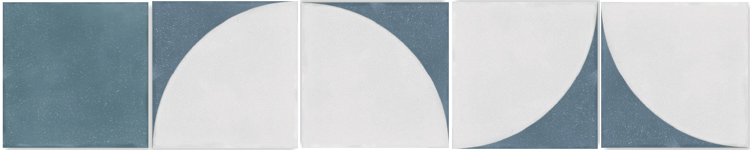

In [76]:
dots = get_thumbnail('dotsDecorBlue.jpg')
full = get_thumbnail('borealBlue.jpg')
D = (full,
     dots.rotate(270),
     dots.rotate(180),
     dots.rotate(90),
     dots)
reduce(h, D)

In [8]:
alkimia = Image.open('CARAS_ALKIMIA_BLANCO_25X25_1000x.jpg').crop((14, 19, 992, 1487)).resize((600,900))
A = (alkimia.crop((300,0,450,150)),
     alkimia.crop((450,0,600,150)),
     alkimia.crop((0,150,150,300)).rotate(180),
     alkimia.crop((450,300,600,450)),
     alkimia.crop((150,0,300,150)),
     alkimia.crop((0,0,150,150)).rotate(270),
     alkimia.crop((150,300,300,450)),
     alkimia.crop((450,600,600,750)),
     alkimia.crop((300,600,450,750)).rotate(270),
     alkimia.crop((0,300,150,450)).rotate(270),
     alkimia.crop((150,450,300,600)).rotate(270),
     alkimia.crop((300,450,450,600)),
    )

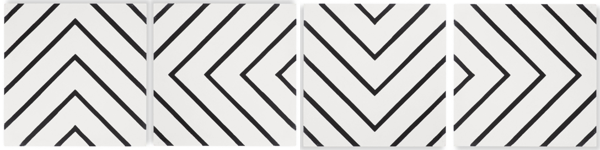

In [78]:
maze = get_thumbnail("ottimo_studio.jpg")
M = (maze.rotate(90),
     maze.rotate(180),
     maze.rotate(270),
     maze)
reduce(h, M)

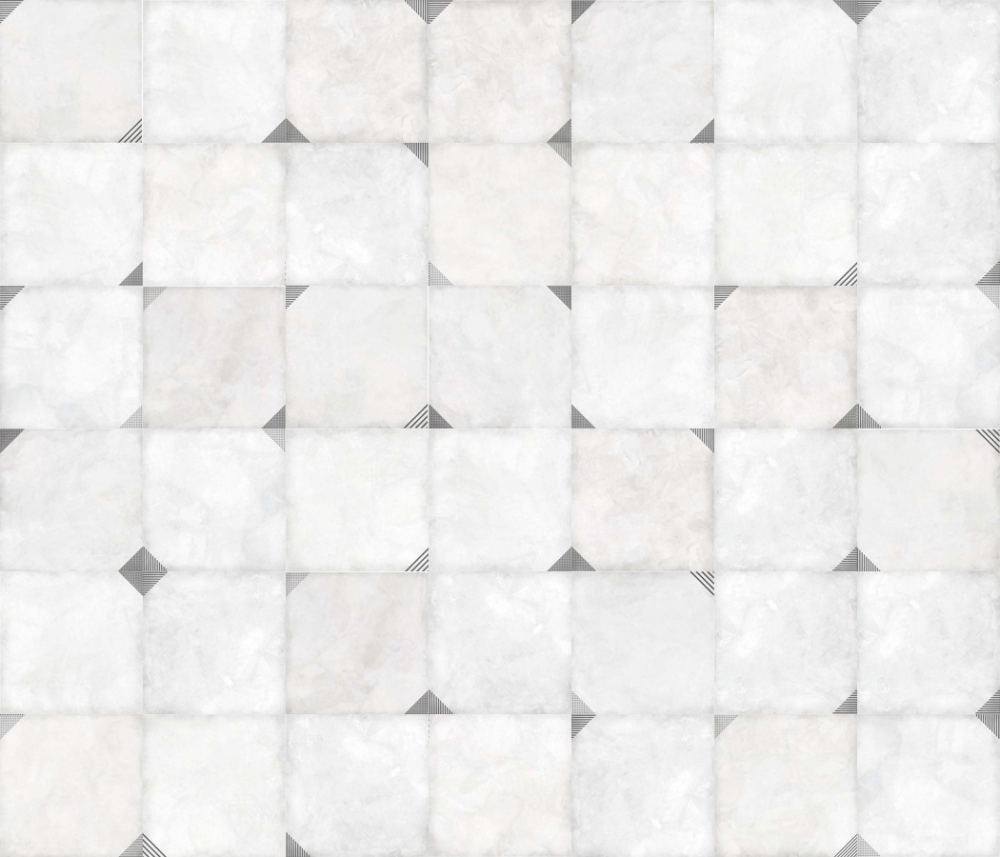

In [12]:
tile_with_rot(A, rand_layout_and_rot(7,6))

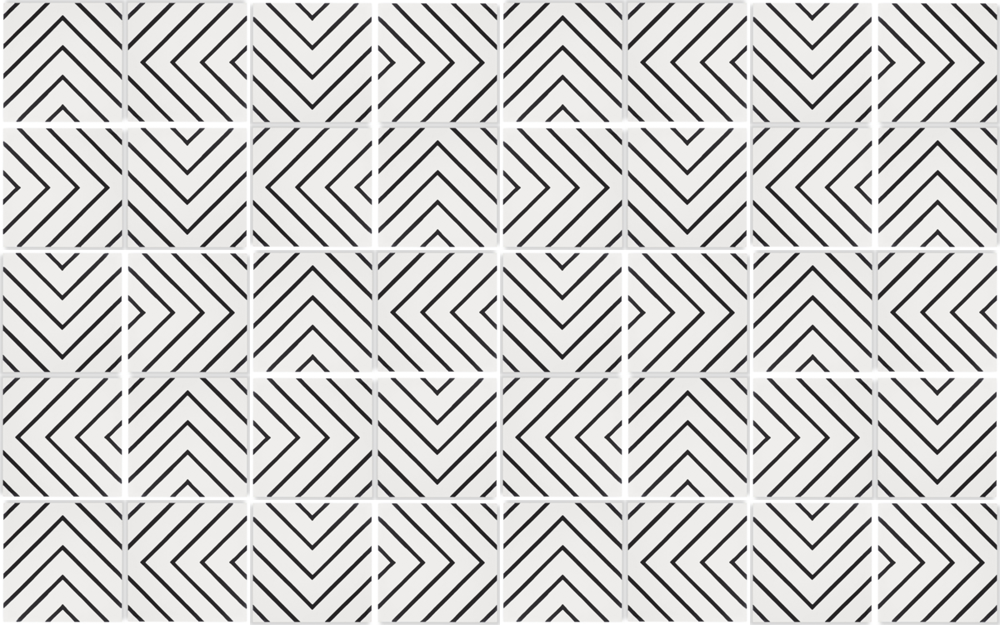

In [62]:
sauwastika = tile(M, repeat_layout(8, 5, [
    [0,1,2,3],
    [3,2,1,0],
    [2,3,0,1],
    [1,0,3,2],
]))
sauwastika

In [47]:
up_and_down = tile(M, [
    [0,1,2,3,0],
    [1,2,3,0,1],
    [2,3,0,1,2],
    [3,0,1,2,3],
    [0,1,2,3,0],
    [1,0,3,2,1],
    [2,3,0,1,2],
    [3,2,1,0,3],
])
up_and_down.show()

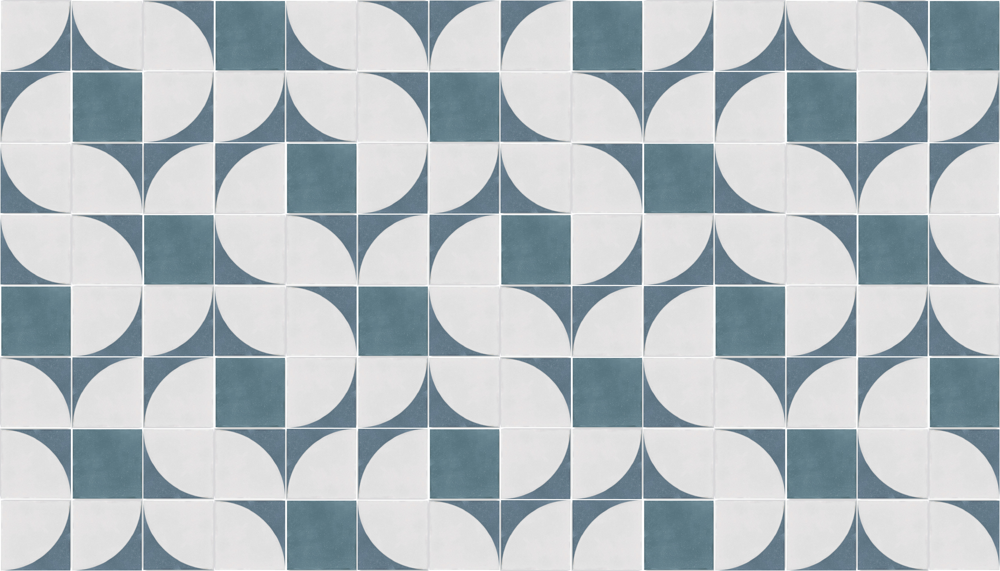

In [72]:
pinwheels = tile(D, repeat_layout(14,8, [
    [0,4,2,3,3,0,1,1,4,2],
    [1,4,2,0,4,2,3,3,0,1],
    [3,0,1,1,4,2,0,4,2,3],
    [4,2,3,3,0,1,1,4,2,0],
    [4,2,0,4,2,3,3,0,1,1],
    [0,1,1,4,2,0,4,2,3,3],
    [2,3,3,0,1,1,4,2,0,4],
    [2,0,4,2,3,3,0,1,1,4],
    [1,1,4,2,0,4,2,3,3,0],
    [3,3,0,1,1,4,2,0,4,2],
]))
pinwheels = tile(D, repeat_with_period(14, 8, 7, [1,4,2,0,4,2,3,3,0,1]))
pinwheels

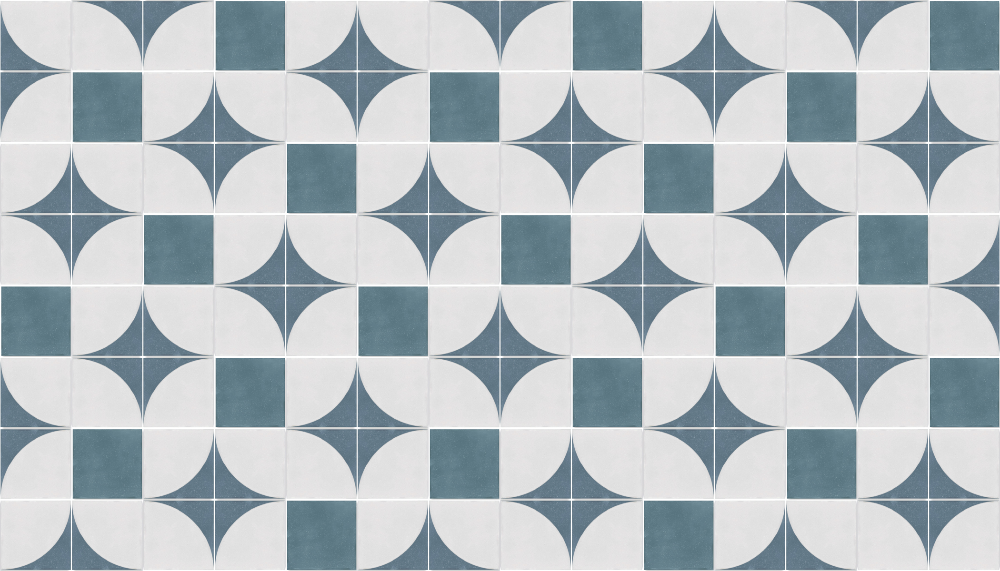

In [70]:
stars_and_squares = tile(D, repeat_layout(14, 8, [
    [4,2,1,0,3],
    [1,0,3,4,2],
    [3,4,2,1,0],
    [2,1,0,3,4],
    [0,3,4,2,1],
]))
stars_and_squares = tile(D, repeat_with_period(14, 8, 2, [4,2,1,0,3]))

stars_and_squares

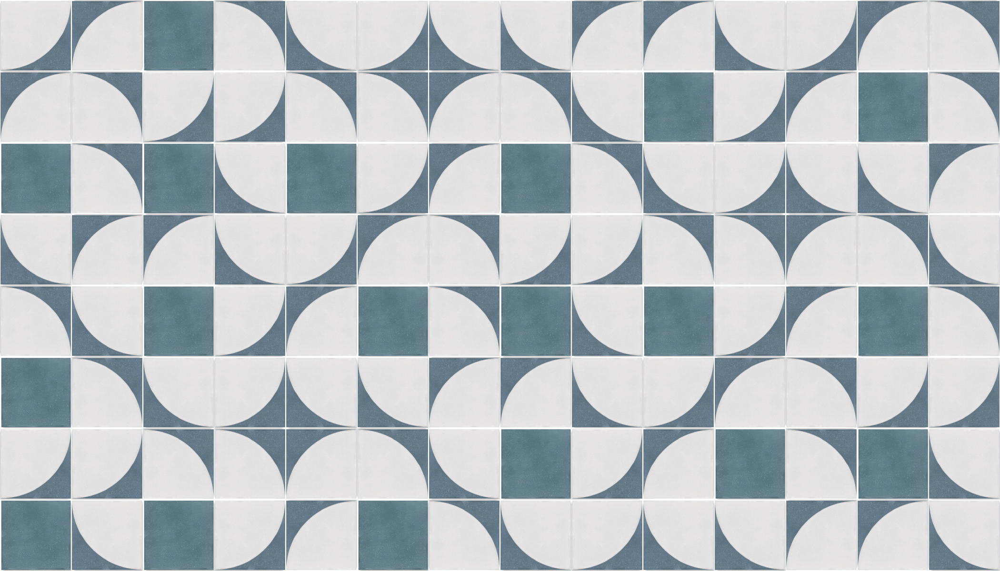

In [61]:
fishes = tile(D, repeat_with_period(14, 8, 12, [3,1,0,2,4,3,4,4,1,1,4,3,1,2,3,3,2,2,1,2,4,0,3,1,0,2,0,4,0]))
fishes

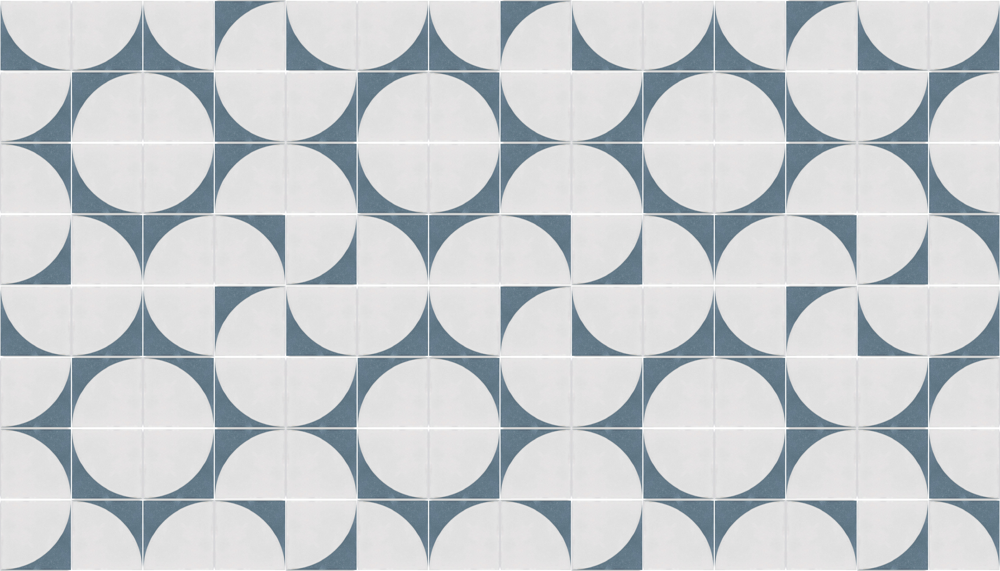

In [41]:
sun_and_pinwheel = tile(D, repeat_layout(14, 8, [
    [4,3,4,1],
    [3,1,2,4],
    [2,4,3,1],
    [3,2,1,2],
]))
sun_and_pinwheel

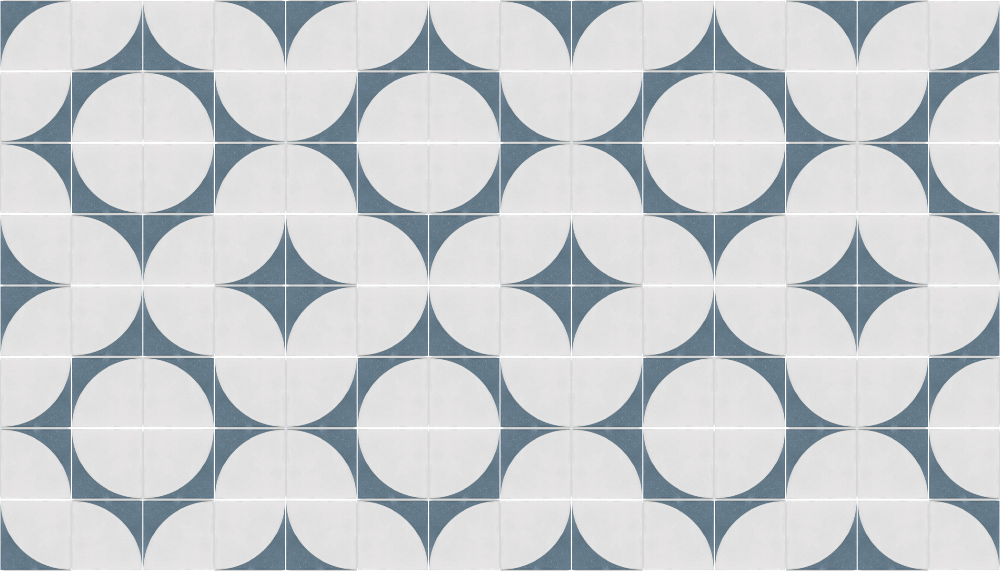

In [34]:
sun_and_star = tile(D, repeat_layout(14, 8, [
    [1,3,4,2],
    [3,1,2,4],
    [2,4,3,1],
    [4,2,1,3],
]))
sun_and_star

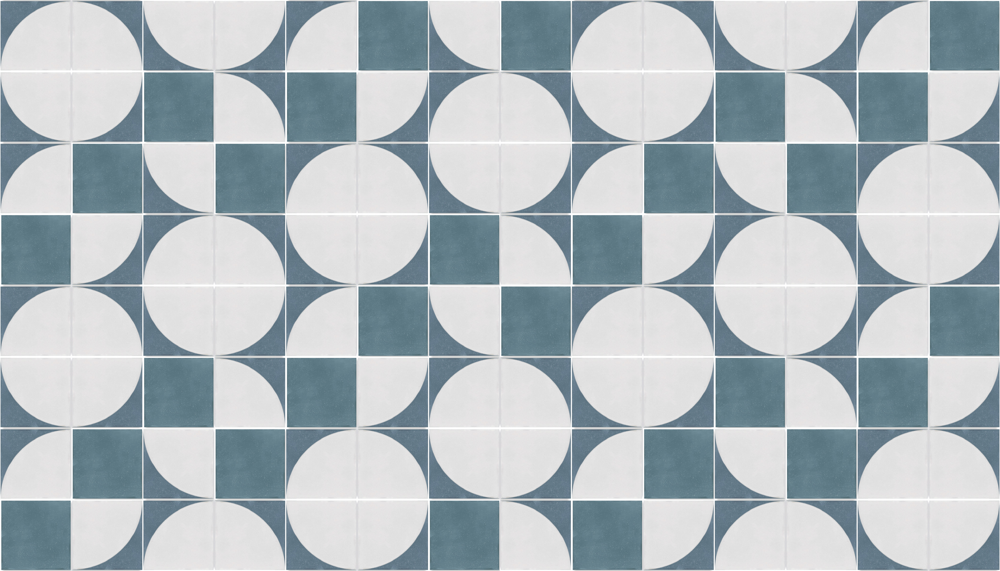

In [35]:
circles = tile(D, repeat_layout(14, 8, [
    [1,2,4,3,1,0,4,0],
    [4,3,0,2,0,3,1,2],
    [1,0,4,0,1,2,4,3],
    [0,3,1,2,4,3,0,2],
]))
circles

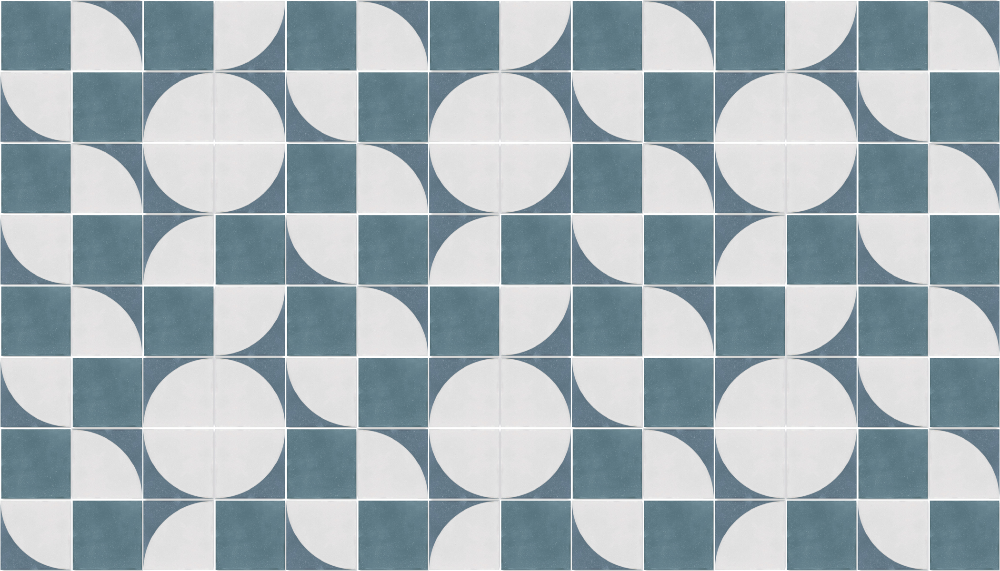

In [42]:
checker_dots = tile(D, overlay_zeros([
    [0,1,0,1],
    [1,0,1,1],
    [0,1,1,1],
    [1,0,1,0],
], repeat_layout(14, 8, [
    [1,2,4,3],
    [4,3,1,2],
    [1,2,4,3],
    [4,3,1,2],
])))
checker_dots

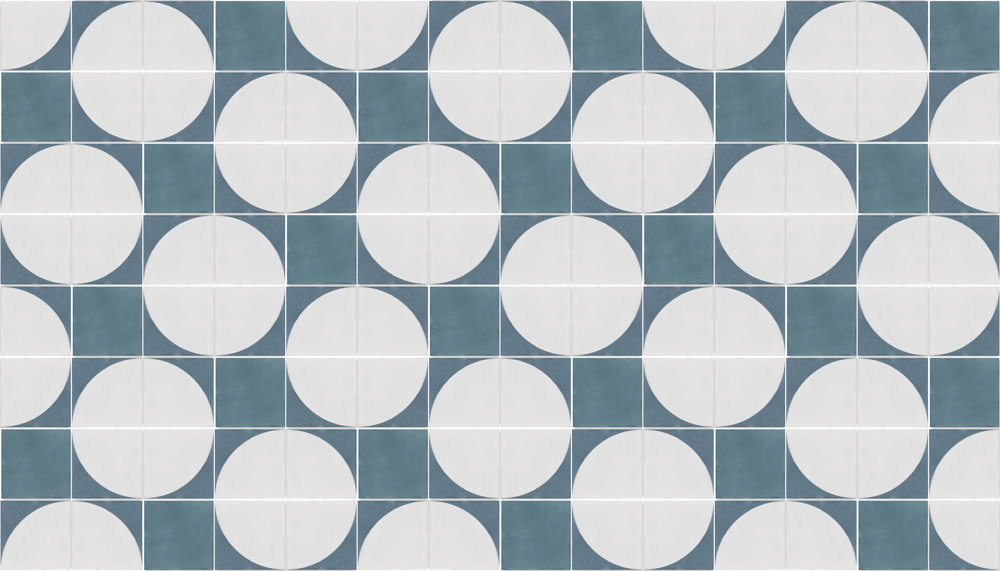

In [43]:
offset_dots = tile(D, repeat_layout(14, 8, [
    [3,1,2,0,4],
    [0,4,3,1,2],
    [1,2,0,4,3],
    [4,3,1,2,0],
    [2,0,4,3,1]
]))
offset_dots